# SPACEc: Cell Segmentation

The aim of cell segmentation is to identify each cell within a given image and derive single cell data from the image. For that we provide two commonly used approaches: Deepcell Mesmer and Cellpose. Mesmer is a deep learning-enabled segmentation algorithm that works out-of-the-box for most multiplexed images. Apart from that we provide Cellpose that is a deep learning-enabled segmentation algorithm as well but provides different models that can be directly employed. Additionally, Cellpose allows users to easily train their own models. 

For the purpose of this tutorial we will use Mesmer.

The steps of the script are:

1. Deciding on the image channels for segmentation 
2. Running segmentation 
3. Quality control the segmented images
4. Store the data for further processing

## Set up envrionment

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# import spacec first
import spacec as sp

#import standard packages
import pathlib
import warnings
import matplotlib
import pickle
warnings.filterwarnings('ignore')

INFO:root: * TissUUmaps version: 3.1.1.6


In [3]:
# set the default color map to viridis, the below paramters can be chanaged
matplotlib.rcParams["image.cmap"] = 'viridis'

In [4]:
root_path = pathlib.Path("/home/tim/Dokumente/GitHub/SPACEc/")
data_path = root_path / 'example_data/raw/' # where the data is stored

# where you want to store the output
output_dir = root_path / 'example_data/output/'
output_dir.mkdir(exist_ok=True, parents=True)

If you want to use GPU acceleration for the segmentation you should ensure that CUDA is installed and the GPU detected by the python environment. If you have a compatible Nvidia card but never installed CUDA Toolkit before you can find installation instructions here: https://developer.nvidia.com/cuda-downloads

In [5]:
#check if GPU availability
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Nov_18_09:45:30_PST_2021
Cuda compilation tools, release 11.5, V11.5.119
Build cuda_11.5.r11.5/compiler.30672275_0
Sat May 18 16:36:24 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.67                 Driver Version: 550.67         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1070        Off |   00000000:01:00.0  On |                  N/A |
|  0%   40C    P0      

In [18]:
sp.hf.check_for_gpu()

INFO:cellpose.core:** TORCH CUDA version installed and working. **


GPU is available to Tensorflow
GPU is available to Pytorch


## Cell segmentation

Before committing to potentially time intense segmentation it might be useful to visualize the segmentation channels. In this tutorial we provide both nuclei and membrane channels. Especially if no general membrane marker is available it is useful to combine membrane markers as shown below. 

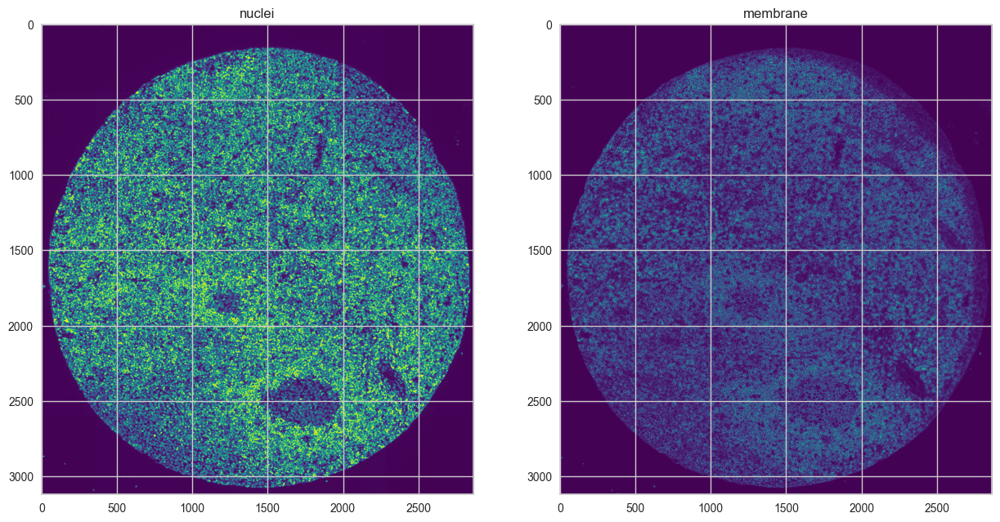

In [5]:
# (optional, one can just use nuclei for segmentation)
# Visualize membrane channels to use for cell segmentation 

sp.pl.segmentation_ch(
    file_name = output_dir / 'reg001_X01_Y01_Z01.tif', # image for segmentation
    channel_file = data_path / 'channelnames.txt', # all channels used for staining
    output_dir = output_dir, #
    extra_seg_ch_list = ["CD45", "betaCatenin"], #default is None; if provide more than one channel, then they will be combined
    nuclei_channel = 'DAPI', # channel to use for nuclei segmentation
    technology = 'Phenocycler', 
)

After deciding on the channels for segmentation, segmentation is performed with the 'cell_segmentation' function. Besides choosing the channels the function allows to select the segmentation model. The function expects a multichannel tif file and a channel names file as input (please see our example data as an example). The segmentation output is stored as csv file.

Create image channels!
Segmenting with Mesmer!


INFO:root:Converting image dtype to float


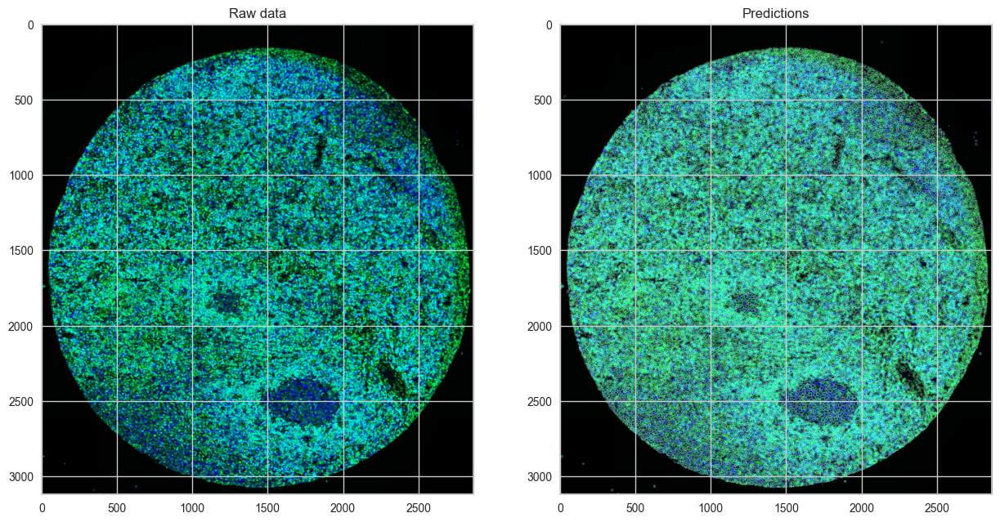

Quantifying features after segmentation!


Processing channels: 100%|██████████| 59/59 [00:18<00:00,  3.16it/s]


Done!


In [9]:
# choose between cellpose or mesmer for segmentation
# first image
# seg_output contains {'img': img, 'image_dict': image_dict, 'masks': masks}
seg_output1 = sp.tl.cell_segmentation(
    file_name = output_dir / 'reg001_X01_Y01_Z01.tif',
    channel_file = data_path / 'channelnames.txt',
    output_dir = output_dir,
    seg_method ='mesmer', # cellpose or mesmer
    nuclei_channel = 'DAPI',
    output_fname = 'tonsil1',
    membrane_channel_list = ["CD45", "betaCatenin"], #default is None; if provide more than one channel, then they will be combined
    compartment = 'whole-cell', # mesmer # segment whole cells or nuclei only
    technology ='Phenocycler', # Phenocycler or codex
    resize_factor=1, # default is 1; if the image is too large, lower the value. Lower values will speed up the segmentation but may reduce the accuracy.
    size_cutoff = 0)

Create image channels!
Segmenting with Mesmer!


2024-05-18 17:09:20.836361: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-18 17:09:20.859345: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-18 17:09:20.859561: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-18 17:09:20.860312: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

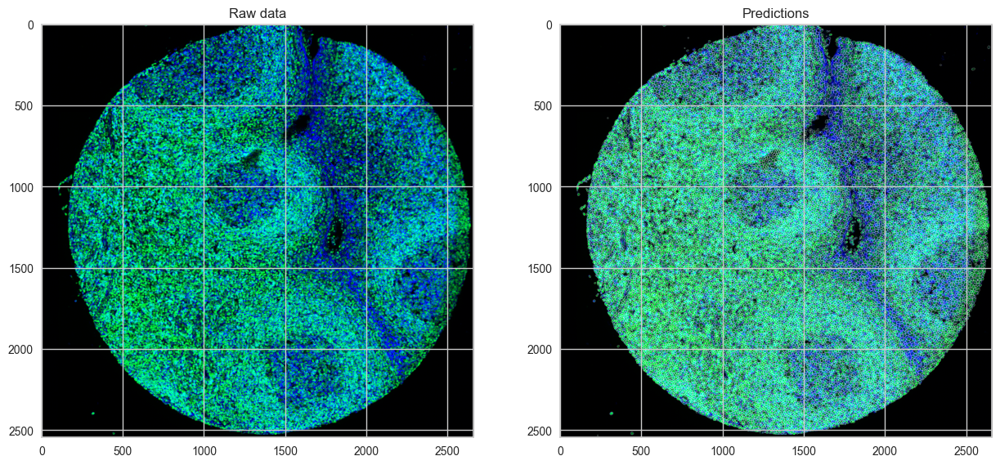

Quantifying features after segmentation!


Processing channels: 100%|██████████| 59/59 [00:13<00:00,  4.29it/s]


Done!


In [8]:
# second image
# choose the method that is consistent of the first image for a more comparable result
# seg_output contains {'img': img, 'image_dict': image_dict, 'masks': masks}
seg_output2 = sp.tl.cell_segmentation(
    file_name = output_dir / 'reg002_X01_Y01_Z01.tif',
    channel_file = data_path / 'channelnames.txt',
    output_dir = output_dir,
    output_fname = 'tonsil2',
    seg_method ='mesmer', # cellpose or mesmer
    nuclei_channel = 'DAPI',
    membrane_channel_list = ["CD45", "betaCatenin"], #default is None #default is None; if provide more than one channel, then they will be combined
    technology ='Phenocycler', # Phenocycler or codex
    compartment = 'whole-cell', # mesmer # segment whole cells or nuclei only
    resize_factor=1, # default is 1; if the image is too large, lower the value. Lower values will speed up the segmentation but may reduce the accuracy.
    size_cutoff = 0) 

In addition to the mesmer segmentation that is used in our example you can use cellpose as shown in the example below.

In [6]:
seg_output_cellpose = sp.tl.cell_segmentation(
    file_name = output_dir / 'reg002_X01_Y01_Z01.tif',
    channel_file = data_path / 'channelnames.txt',
    output_dir = output_dir,
    output_fname = 'tonsil2',
    seg_method ='cellpose', # cellpose or mesmer
    model='cyto3', # cellpose model
    diameter=28, # average cell diameter (in pixels). If set to None, it will be automatically estimated.
    nuclei_channel = 'DAPI',
    membrane_channel_list = ["CD45", "betaCatenin"], #default is None #default is None; if provide more than one channel, then they will be combined
    technology ='Phenocycler', # Phenocycler or codex
    resize_factor=1, # default is 1; if the image is too large, lower the value. Lower values will speed up the segmentation but may reduce the accuracy.
    size_cutoff = 0) 

Create image channels!
Segmenting with Cellpose!
Selecting nucleus and membrane channel for segmentation.


INFO:cellpose.core:** TORCH CUDA version installed and working. **
INFO:cellpose.core:>>>> using GPU
INFO:cellpose.models:>> cyto3 << model set to be used
INFO:cellpose.models:>>>> loading model /home/tim/.cellpose/models/cyto3
INFO:cellpose.models:>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
INFO:cellpose.models:channels set to [1, 3]
INFO:cellpose.models:~~~ FINDING MASKS ~~~
INFO:cellpose.models:>>>> TOTAL TIME 12.15 sec


diameter set to: 28
Quantifying features after segmentation!


Processing channels: 100%|██████████| 59/59 [00:13<00:00,  4.45it/s]


Done!


## Viusalizing the segmentation result

Not every dataset works equally well with all segmentation models due to differences in tissue type, structure or image quality. Therefore, it is of major importance to check the segmentation results before continuing with the data analysis. the 'show_masks' function selects random tiles of a user defined size from the image to provide examples to evaluate the segmentation quality. If the segmentation quality is not acceptable a different model should be tried. For especially challenging datasets users can also try to retrain a model specifically for their images. 

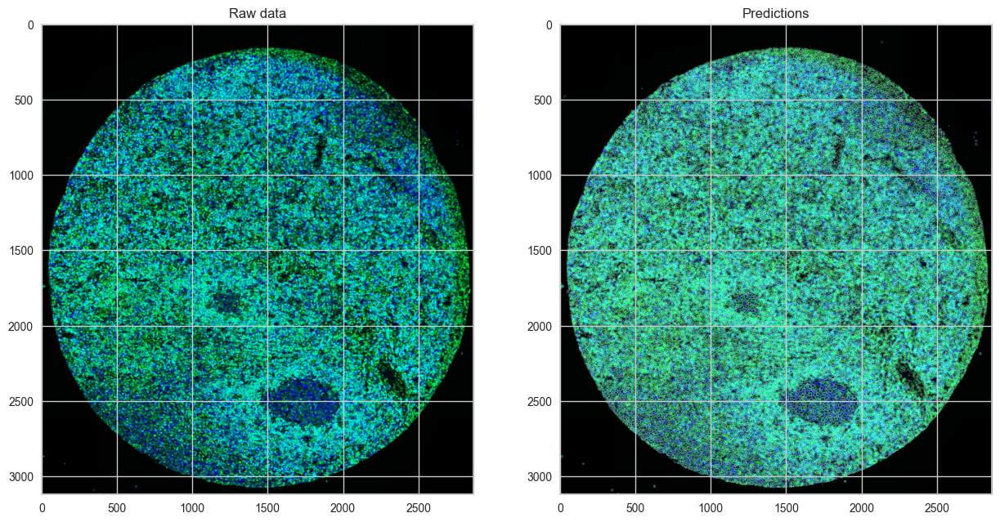

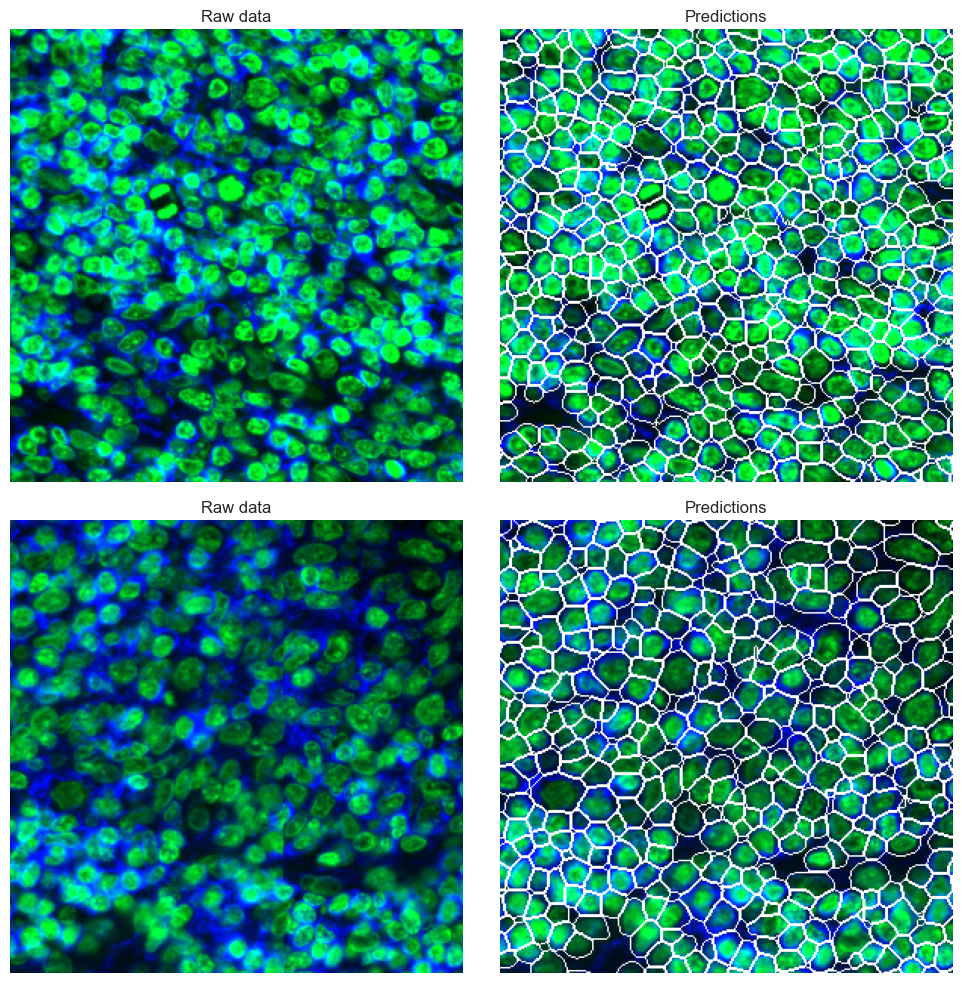

In [10]:
overlay_data1, rgb_images1 = sp.pl.show_masks(
    seg_output=seg_output1,
    nucleus_channel = 'DAPI', # channel used for nuclei segmentation (displayed in blue)
    additional_channels = ["CD45", "betaCatenin"], # additional channels to display (displayed in green - channels will be combined into one image)
    show_subsample = True, # show a random subsample of the image
    n=2, #need to be at least 2
    tilesize = 300,# number of subsamples and tilesize
    rand_seed = 1)

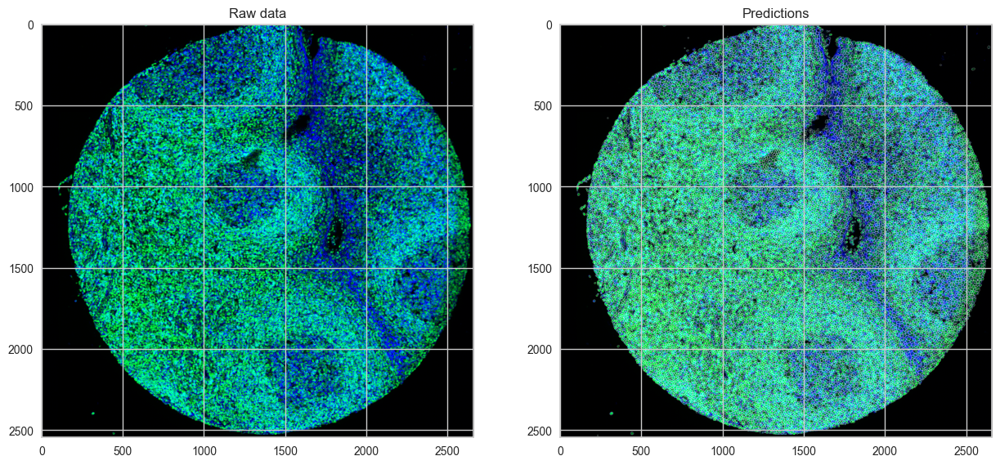

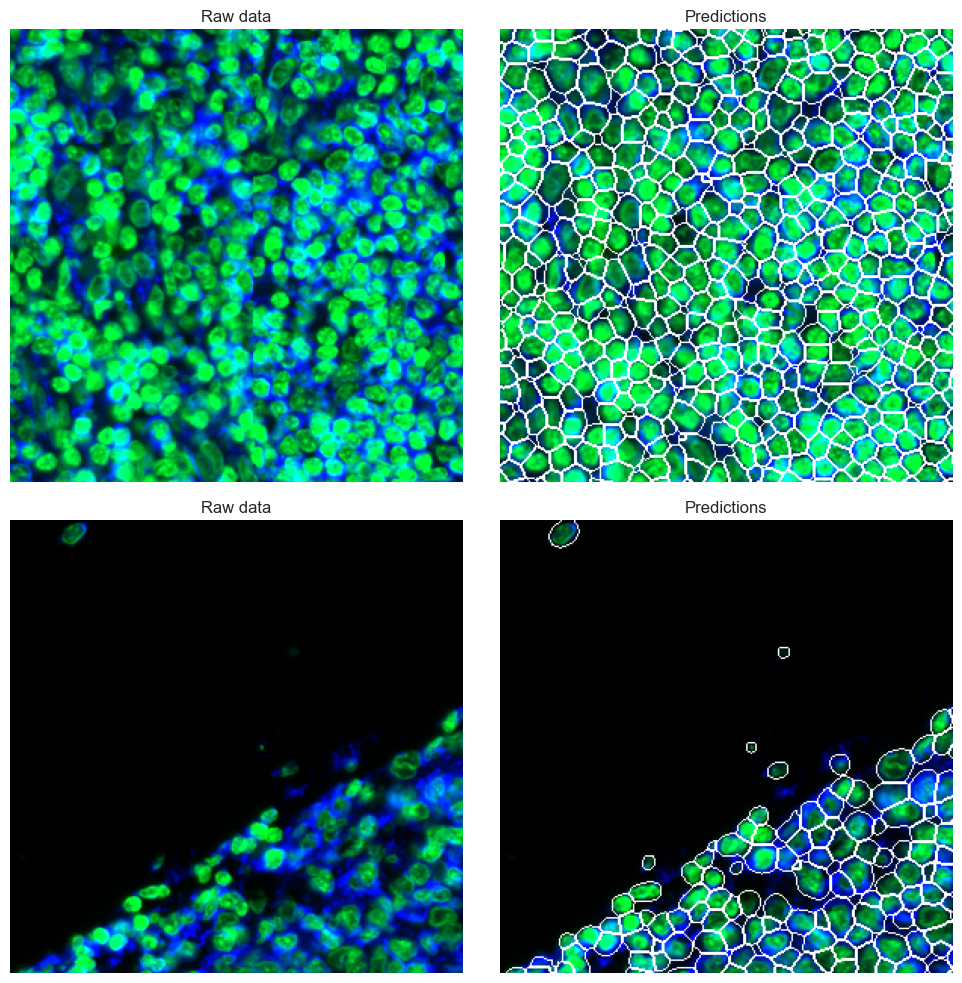

In [11]:
overlay_data2, rgb_images2 = sp.pl.show_masks(
    seg_output=seg_output2,
    nucleus_channel = 'DAPI', # channel used for nuclei segmentation (displayed in blue)
    additional_channels = ["CD45", "betaCatenin"], # additional channels to display (displayed in green - channels will be combined into one image)
    show_subsample = True, # show a random subsample of the image
    n=2, #need to be at least 2
    tilesize = 300, # number of subsamples and tilesize
    rand_seed = 3) 

## Save the segmentation result

After successful segmentation, the images and masks can be stored in a pickle file for later easy access.

In [12]:
#Save segmentation output
with open(output_dir / 'seg_output_tonsil1.pickle', 'wb') as f:
    pickle.dump(seg_output1, f)

with open(output_dir / 'seg_output_tonsil2.pickle', 'wb') as f:
    pickle.dump(seg_output2, f)
    
#Save the overlay of the data
with open(output_dir / 'overlay_tonsil1.pickle', 'wb') as f:
    pickle.dump(overlay_data1, f)

with open(output_dir / 'overlay_tonsil2.pickle', 'wb') as f:
    pickle.dump(overlay_data2, f)